In [0]:
from google.colab import drive
drive.mount('/content/gdrive')


Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/weights /content
# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/data /content
# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/nm01 /content
# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/1 /content
# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/6 /content
# !cp  /content/gdrive/My\ Drive/whiteboard_object_detection/n1_split.pickle /content

# !cp -r /content/gdrive/My\ Drive/whiteboard_object_detection/weights/model_final_1500.pth /content


In [0]:
# install dependencies: (use cu100 because colab is on CUDA 10.0)
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab


Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9MB 23kB/s 
     |████████████████████████████████| 4.1MB 38.0MB/s 
  Found existing installation: torch 1.4.0
    Uninstalling torch-1.4.0:
      Successfully uninstalled torch-1.4.0
  Found existing installation: torchvision 0.5.0
    Uninstalling torchvision-0.5.0:
      Successfully uninstalled torchvision-0.5.0
     |████████████████████████████████| 276kB 7.4MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp36-cp36m-linux_x86_64.whl size=44074 sha256=0ea8d8516d05c337b19db85b3df96503df550d2fc0387e39ce2890779daf024b
  Stored in directory: /root/.cache/pip/wheels/ad/56/bc/1522f864feb2a358ea6f1a92b4798d69ac783a28e80567a18b
Successfully built pyyaml
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-70dwfcf1
  Running command git 

In [0]:
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html
     |████████████████████████████████| 6.2MB 63.3MB/s 
     |████████████████████████████████| 61kB 5.7MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.dev200308-cp36-none-any.whl size=37813 sha256=af74f78b73048b812952330a3fd948c15bd6992b98d046b37ca2d6fe80279924
  Stored in directory: /root/.cache/pip/wheels/b2/56/d4/bd2b3fb396b459ff8dcfc97f2b41a617976db6bec611237c46
Successfully built fvcore
  Found existing installation: tqdm 4.28.1
    Uninstalling tqdm-4.28.1:
      Successfully uninstalled tqdm-4.28.1


In [0]:

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [0]:
!pip install xmltodict

In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import xmltodict
import glob

def get_hc_dicts(img_dir):
    img_paths=glob.glob(img_dir+"/*.jpg" )
    dataset_dicts=[]
    for idx,img_path in enumerate(img_paths):
        record={}
        record["file_name"] = img_path
        record["image_id"] = idx
        
        xmlpath=img_dir +"/annotations/"+ os.path.basename(img_path)[:-3]+'xml'
        anno_dict = xmltodict.parse( open( xmlpath , 'rb' ) )
        
        record["height"] =int(float(anno_dict[ 'annotation' ]['size']['height']))
        record["width"] =int(float(anno_dict[ 'annotation' ]['size']['width']))

        objs=[]
        if 'object' in anno_dict[ 'annotation' ].keys():
            if not isinstance(anno_dict[ 'annotation' ][ 'object' ], list):
                anno_dict[ 'annotation' ][ 'object' ]=[anno_dict[ 'annotation' ][ 'object' ]]
            for text_obj in anno_dict[ 'annotation' ][ 'object' ]:
                bndbox = text_obj[ 'bndbox' ]
                xmin=int(bndbox[ 'xmin' ])
                ymin=int(bndbox[ 'ymin' ])
                xmax=int(bndbox[ 'xmax' ])
                ymax=int(bndbox[ 'ymax' ]) 
                
                poly=[ (xmin,ymin),(xmax,ymin),(xmax,ymax),(xmin,ymax)]
                poly=list(itertools.chain.from_iterable(poly))
                obj = {
                "bbox": [xmin,ymin,xmax,ymax],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
                "iscrowd": 0
                }
                objs.append(obj)
        else:
            poly=[(0,0),(0,0),(0,0),(0,0)]
            poly=list(itertools.chain.from_iterable(poly))

            obj = {
                "bbox": [0,0,0,0],
                "bbox_mode": BoxMode.XYXY_ABS,
                "segmentation": [poly],
                "category_id": 0,
                "iscrowd": 0
                }
            objs.append(obj)
        record['annotations']=objs
        dataset_dicts.append(record)
    return dataset_dicts            
            
            

from detectron2.data import DatasetCatalog, MetadataCatalog
for d in ["train", "val"]:
    DatasetCatalog.register("data_" + d, lambda d=d: get_hc_dicts("data/" + d))
    MetadataCatalog.get("data_" + d).set(thing_classes=["data"])
hc_metadata = MetadataCatalog.get("data_train")

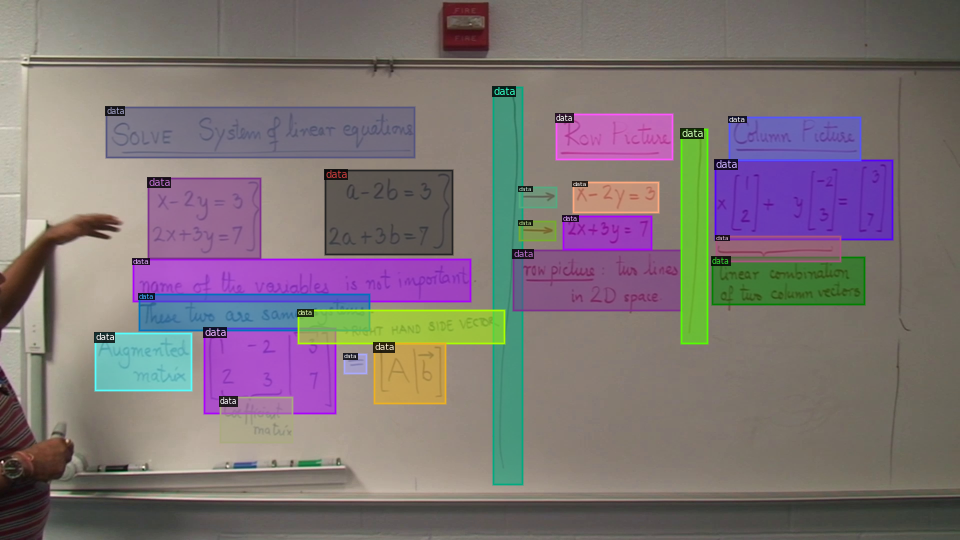

In [0]:
dataset_dicts = get_hc_dicts("data/train")
for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=hc_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("data_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4

cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS=1000
cfg.SOLVER.MAX_ITER = 1500    # 300 iterations seems good enough for this toy dataset; you may need to train longer for a practical dataset
cfg.SOLVER.STEPS = (1000,1500)
cfg.SOLVER.GAMMA=0.05
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (ballon)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/14 08:56:43 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:15, 11.2MB/s]                           
'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[03/14 08:57:04 d2.engine.train_loop]: Starting training from iteration 0
[03/14 08:57:26 d2.utils.events]:  eta: 0:26:17  iter: 19  total_loss: 4.070  loss_cls: 0.633  loss_box_reg: 0.248  loss_mask: 0.687  loss_rpn_cls: 2.330  loss_rpn_loc: 0.281  time: 1.0628  data_time: 0.0567  lr: 0.000020  max_mem: 4982M
[03/14 08:57:48 d2.utils.events]:  eta: 0:26:16  iter: 39  total_loss: 2.555  loss_cls: 0.600  loss_box_reg: 0.739  loss_mask: 0.649  loss_rpn_cls: 0.168  loss_rpn_loc: 0.319  time: 1.0830  data_time: 0.0160  lr: 0.000040  max_mem: 4982M
[03/14 08:58:11 d2.utils.events]:  eta: 0:26:25  iter: 59  total_loss: 2.347  loss_cls: 0.529  loss_box_reg: 0.872  loss_mask: 0.601  loss_rpn_cls: 0.069  loss_rpn_loc: 0.260  time: 1.0975  data_time: 0.0117  lr: 0.000060  max_mem: 4982M
[03/14 08:58:34 d2.utils.events]:  eta: 0:26:19  iter: 79  total_loss: 2.161  loss_cls: 0.494  loss_box_reg: 0.850  loss_mask: 0.545  loss_rpn_cls: 0.054  loss_rpn_loc: 0.221  time: 1.1063  data_time: 0.0147  lr:

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("data_val", )
predictor = DefaultPredictor(cfg)

In [0]:
import time, psutil
uptime = time.time() - psutil.boot_time()
remain = 12*60*60 - uptime 
print(remain/(60*60))

10.056434202194215


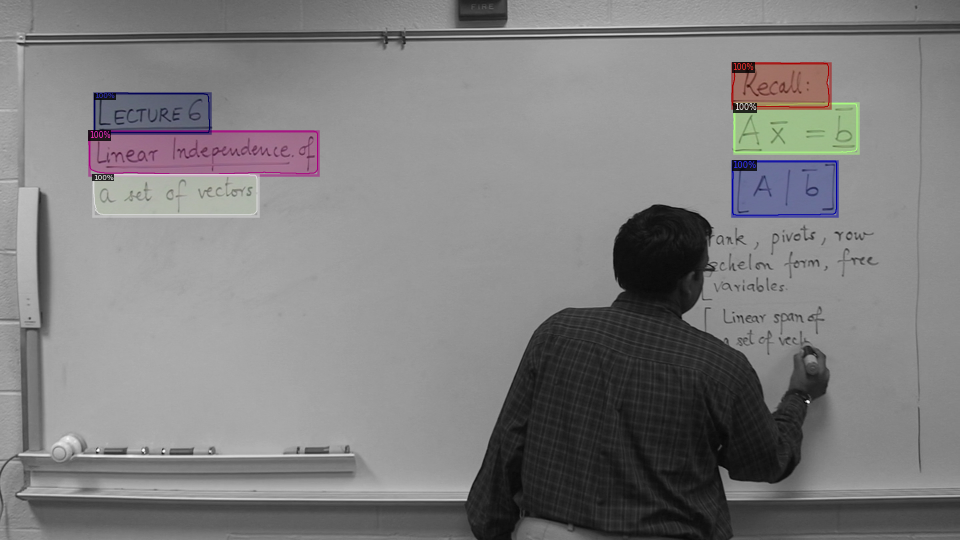

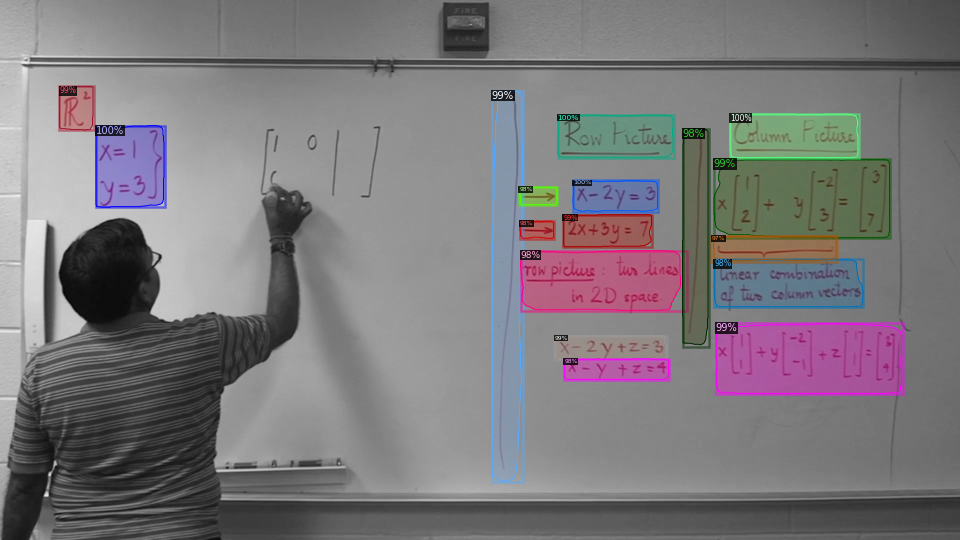

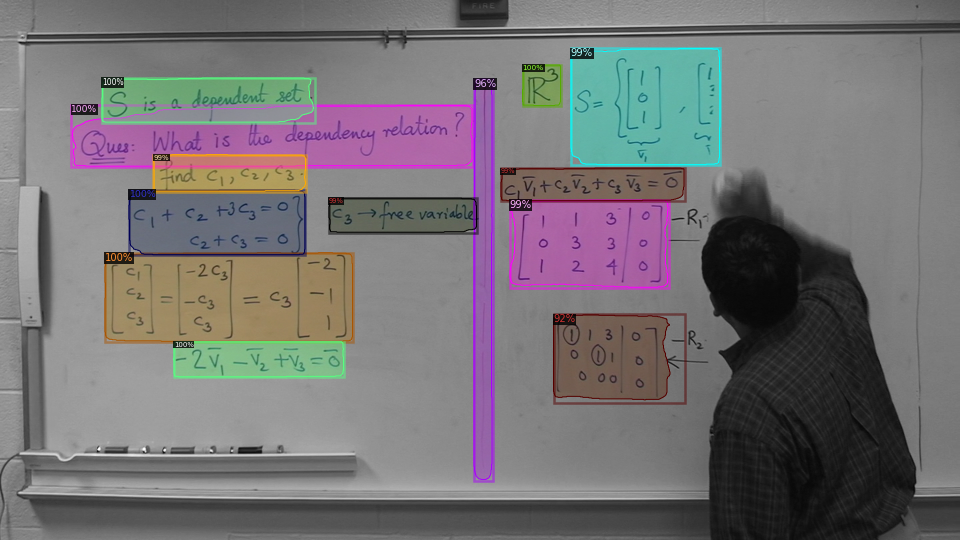

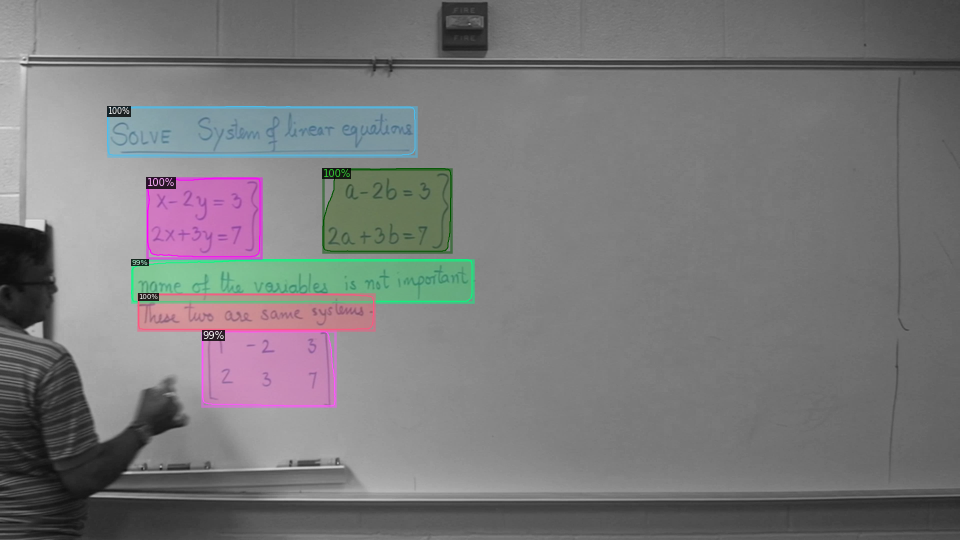

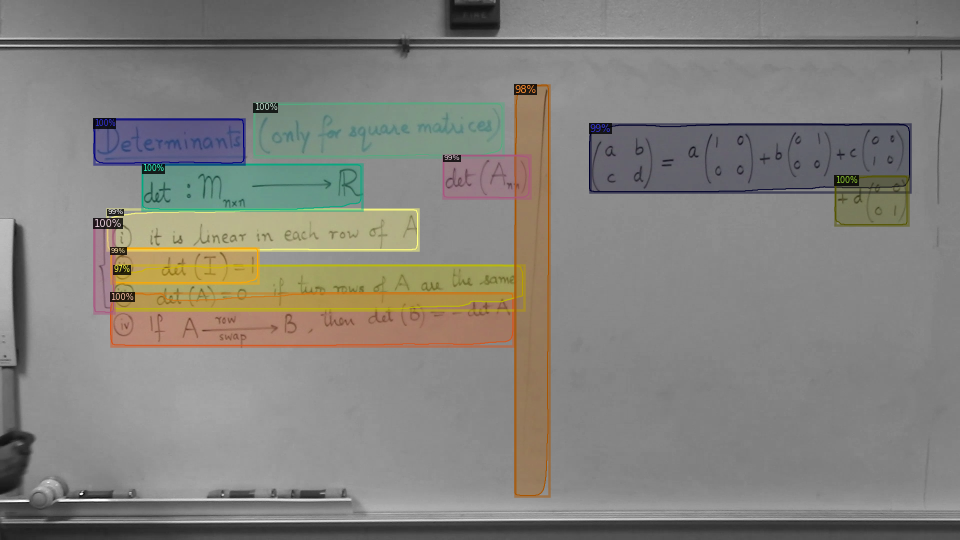

In [0]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_hc_dicts("data/val")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=hc_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "data_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

WARNING [03/14 02:08:10 d2.evaluation.coco_evaluation]: json_file was not found in MetaDataCatalog for 'data_val'. Trying to convert it to COCO format ...
[03/14 02:08:10 d2.data.datasets.coco]: Converting dataset annotations in 'data_val' to COCO format ...)
[03/14 02:08:10 d2.data.datasets.coco]: Converting dataset dicts into COCO format
[03/14 02:08:10 d2.data.datasets.coco]: Conversion finished, num images: 56, num annotations: 753
[03/14 02:08:10 d2.data.datasets.coco]: Caching annotations in COCO format: ./output/data_val_coco_format.json
[03/14 02:08:10 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|    data    | 753          |
|            |              |
[03/14 02:08:10 d2.data.common]: Serializing 56 elements to byte tensors and concatenating them all ...
[03/14 02:08:10 d2.data.common]: Serialized dataset takes 0.06 MiB
[03/14 02:08:10 d2.evaluation.evaluator]: Start inference on 56 images
[03/1

OrderedDict([('bbox',
              {'AP': 83.93643288328934,
               'AP50': 97.70536847054245,
               'AP75': 95.66892685667513,
               'APl': 85.32939327435669,
               'APm': 76.12932577781861,
               'APs': 0.0}),
             ('segm',
              {'AP': 80.72607421102987,
               'AP50': 96.94625864383522,
               'AP75': 93.38105006424988,
               'APl': 82.43380552373209,
               'APm': 72.95713588757108,
               'APs': 0.0})])

In [0]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 2052), started 0:02:51 ago. (Use '!kill 2052' to kill it.)

In [0]:
# training for 1000 more iterations


cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final_1500.pth")

cfg.SOLVER.BASE_LR = 0.00025  
cfg.SOLVER.MAX_ITER = 2500
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/14 02:41:46 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("data_val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "data_val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[03/14 03:06:40 d2.data.common]: Serializing 56 elements to byte tensors and concatenating them all ...
[03/14 03:06:40 d2.data.common]: Serialized dataset takes 0.06 MiB
[03/14 03:06:40 d2.evaluation.evaluator]: Start inference on 56 images
[03/14 03:06:44 d2.evaluation.evaluator]: Inference done 11/56. 0.1740 s / img. ETA=0:00:12
[03/14 03:06:49 d2.evaluation.evaluator]: Inference done 30/56. 0.1731 s / img. ETA=0:00:07
[03/14 03:06:55 d2.evaluation.evaluator]: Inference done 49/56. 0.1733 s / img. ETA=0:00:01
[03/14 03:06:57 d2.evaluation.evaluator]: Total inference time: 0:00:14.091497 (0.276304 s / img per device, on 1 devices)
[03/14 03:06:57 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:08 (0.172746 s / img per device, on 1 devices)
[03/14 03:06:57 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/14 03:06:57 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[03/14 03:06:57 d2.evaluation.coco_evalua

OrderedDict([('bbox',
              {'AP': 83.87356044099064,
               'AP50': 96.94103977785569,
               'AP75': 94.82895930777062,
               'APl': 85.17802604466138,
               'APm': 76.92004478564259,
               'APs': 0.0}),
             ('segm',
              {'AP': 81.17293017112283,
               'AP50': 96.94103977785569,
               'AP75': 93.56013592846323,
               'APl': 82.5704069675835,
               'APm': 73.47488473908716,
               'APs': 0.0})])

In [0]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

In [0]:
pickle_in = open("n1_split.pickle", "rb")
all_frames = pickle.load(pickle_in)

In [0]:
import cv2
import torch
import os
import time
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

def get_predictor():

    cfg = get_cfg()
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
    cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
    cfg.MODEL.WEIGHTS = "model_final_1500.pth"
    return DefaultPredictor(cfg)


# Visualizing output

# v = Visualizer(im[:, :, ::-1], MetadataCatalog.get('../31141.jpg'), scale=1.2)
# v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
# cv2.imshow("marked",v.get_image()[:, :, ::-1])
#
# cv2.waitKey(0)
# cv2.destroyAllWindows()


def get_annotations(all_frames=[]):
    time_start=time.time()
    annotations=[]
    predictor=get_predictor()
    # im = cv2.imread('../31141.jpg')
    # outputs = predictor(im)

    for second,frame in enumerate(all_frames):
        outputs = predictor(frame)
        boxes=[]
        # print(second ,end=" ")
        for pred_box in outputs["instances"].pred_boxes:

            # print(pred_box)
            pred_box = pred_box.int()

            box = [pred_box[0].item(), pred_box[1].item(), pred_box[2].item(), pred_box[3].item()]

            # print(box)
            boxes.append(box)
        annotations.append(boxes)
    time_end=time.time()
    print("It took %d seconds for annotation." % (time_end - time_start))

    return annotations



In [0]:
import glob
import os
all_frames=[0]*768
for path in glob.glob("/content/n1_split/*.jpg"):
  all_frames[int(os.path.basename(path)[:-4])]=cv2.imread(path)
  # print(path)

  # all_frames.append(cv2.imread(path))
# annotations=get_annotations(all_frames)  

In [0]:
annotations=get_annotations(all_frames)  

It took 278 seconds for annotation.


In [0]:
import pickle



pickle_out = open("n1_anno.pickle","wb")
pickle.dump(annotations, pickle_out)
pickle_out.close()

In [0]:
!nvidia-smi

Sun Mar 15 04:46:14 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.59       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   29C    P0    25W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [0]:
annotations[0]

[]

In [0]:
from google.colab.patches import cv2_imshow

import glob
import os
for path in glob.glob("/content/n1_split/*.jpg"):
  annotations[int(os.path.basename(path)[:-4])]
  v = Visualizer(im[:, :, ::-1], MetadataCatalog.get(path), scale=0.5)
  v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2.imshow("marked",v.get_image()[:, :, ::-1])

In [0]:
from PIL import Image , ImageDraw
from matplotlib import cm
%matplotlib inline
from matplotlib.pyplot import imshow
for i,image in enumerate(all_frames[120:130]):
    boxes=annotations[i+120]
    image=Image.fromarray(image.astype('uint8'), 'RGB')
    for  box in boxes:
        draw = ImageDraw.Draw(image)
        draw.rectangle([(box[0], box[1]), (box[2], box[3])], outline="black")
    # image = image.convert('RGB')
    image = np.array(image)
    cv2_imshow(image)



In [0]:
# image=Image.fromarray(np.uint8(cm.gist_earth(all_frames[0]) * 255))
image = Image.fromarray(all_frames[0].astype('uint8'), 'RGB')